# Diabetes Binary Classification

Objective: classify a diabetes diagnosis based on patients' data. We want to gain insights on different factors - such as demographics, lifestyle, medical history, medical measurements, medication, symtoms - that are associated to diabetes.

## I. Import libraries and datasets

These are the libraries to import and common methods to use for the project.
* pandas. Useful for:
  * visualization 
    * `hist()`
  * normalization, 
  * merge and join, 
  * loading and savings 
    * `read_csv()`
  * data inspection
  * other
    * [`corr()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html)
    * [`drop()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
* numpy:
  * `array()`
  * `squeeze()`
* tensorflow provides the model we can use to make the predication on our diabetes dataset
* sklearn
  * metrics
    * [`confusion_matrix()`](https://www.tensorflow.org/api_docs/python/tf/math/confusion_matrix)
    * `ConfusionMatrixDisplay()`
  * model_selection
    * `train_test_split()`
  * preprocessing
    * [`MinMaxScaler`](https://scikit-learn.org/stable/modules/preprocessing.html)
* seaborn. Useful for high level data visualization
  * `heatmap()`
  * [`pairplot()`](https://seaborn.pydata.org/generated/seaborn.pairplot.html)
* `matplotlib.pyplot`
  * `subplots()`

In [330]:
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn as sk
import tensorflow as tf

import matplotlib.pyplot as plt
import tensorflow.keras as keras

from keras.models import Sequential
from keras.layers import Dense

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler

## II. Describe and display the datasets
* display the datasets
* find the correlations

This dataset contains comprehensive health data for 1,879 patients, uniquely identified with IDs ranging from 6000 to 7878. The data includes demographic details, lifestyle factors, medical history, clinical measurements, medication usage, symptoms, quality of life scores, environmental exposures, and health behaviors. Each patient is associated with a confidential doctor in charge, ensuring privacy and confidentiality.

[Data source: Diabetes Health Dataset Analysis](https://www.kaggle.com/datasets/rabieelkharoua/diabetes-health-dataset-analysis/data)

## Patient Information
### Patient ID
* PatientID: A unique identifier assigned to each patient (6000 to 7878).
### Demographic Details
* Age: The age of the patients ranges from 20 to 90 years.
* Gender: Gender of the patients, where 0 represents Male and 1 represents Female.
* Ethnicity: The ethnicity of the patients, coded as follows:
  * 0: Caucasian
  * 1: African American
  * 2: Asian
  * 3: Other
* SocioeconomicStatus: The socioeconomic status of the patients, coded as follows:
  * 0: Low
  * 1: Middle
  * 2: High
* EducationLevel: The education level of the patients, coded as follows:
  * 0: None
  * 1: High School
  * 2: Bachelor's
  * 3: Higher
* Lifestyle Factors
  * BMI: Body Mass Index of the patients, ranging from 15 to 40.
  * Smoking: Smoking status, where 0 indicates No and 1 indicates Yes.
  * AlcoholConsumption: Weekly alcohol consumption in units, ranging from 0 to 20.
  * PhysicalActivity: Weekly physical activity in hours, ranging from 0 to 10.
  * DietQuality: Diet quality score, ranging from 0 to 10.
  * SleepQuality: Sleep quality score, ranging from 4 to 10.
* Medical History
  * FamilyHistoryDiabetes: Family history of diabetes, where 0 indicates No and 1 indicates Yes.
  * GestationalDiabetes: History of gestational diabetes, where 0 indicates No and 1 indicates Yes.
  * PolycysticOvarySyndrome: Presence of polycystic ovary syndrome, where 0 indicates No and 1 indicates Yes.
  * PreviousPreDiabetes: History of previous pre-diabetes, where 0 indicates No and 1 indicates Yes.
  * Hypertension: Presence of hypertension, where 0 indicates No and 1 indicates Yes.
* Clinical Measurements
  * SystolicBP: Systolic blood pressure, ranging from 90 to 180 mmHg.
  * DiastolicBP: Diastolic blood pressure, ranging from 60 to 120 mmHg.
  * FastingBloodSugar: Fasting blood sugar levels, ranging from 70 to 200 mg/dL.
  * 6HbA1c: Hemoglobin A1c levels, ranging from 4.0% to 10.0%.
  * SerumCreatinine: Serum creatinine levels, ranging from 0.5 to 5.0 mg/dL.
  * BUNLevels: Blood Urea Nitrogen levels, ranging from 5 to 50 mg/dL.
  * CholesterolTotal: Total cholesterol levels, ranging from 150 to 300 mg/dL.
  * CholesterolLDL: Low-density lipoprotein cholesterol levels, ranging from 50 to 200 mg/dL.
  * CholesterolHDL: High-density lipoprotein cholesterol levels, ranging from 20 to 100 mg/dL.
  * CholesterolTriglycerides: Triglycerides levels, ranging from 50 to 400 mg/dL.
* Medications
  * AntihypertensiveMedications: Use of antihypertensive medications, where 0 indicates No and 1 indicates Yes.
  * Statins: Use of statins, where 0 indicates No and 1 indicates Yes.
  * AntidiabeticMedications: Use of antidiabetic medications, where 0 indicates No and 1 indicates Yes.
* Symptoms and Quality of Life
  * FrequentUrination: Presence of frequent urination, where 0 indicates No and 1 indicates Yes.
  * ExcessiveThirst: Presence of excessive thirst, where 0 indicates No and 1 indicates Yes.
  * UnexplainedWeightLoss: Presence of unexplained weight loss, where 0 indicates No and 1 indicates Yes.
  * FatigueLevels: Fatigue levels, ranging from 0 to 10.
  * BlurredVision: Presence of blurred vision, where 0 indicates No and 1 indicates Yes.
  * SlowHealingSores: Presence of slow-healing sores, where 0 indicates No and 1 indicates Yes.
  * TinglingHandsFeet: Presence of tingling in hands or feet, where 0 indicates No and 1 indicates Yes.
  * QualityOfLifeScore: Quality of life score, ranging from 0 to 100.
* Environmental and Occupational Exposures
  * HeavyMetalsExposure: Exposure to heavy metals, where 0 indicates No and 1 indicates Yes.
  * OccupationalExposureChemicals: Occupational exposure to harmful chemicals, where 0 indicates No and 1 indicates Yes.
  * WaterQuality: Quality of water, where 0 indicates Good and 1 indicates Poor.
* Health Behaviors
  * MedicalCheckupsFrequency: Frequency of medical check-ups per year, ranging from 0 to 4.
  * MedicationAdherence: Medication adherence score, ranging from 0 to 10.
  * HealthLiteracy: Health literacy score, ranging from 0 to 10.
  * Diagnosis Information ( Target Variable)
  * Diagnosis: Diagnosis status for Diabetes, where 0 indicates No and 1 indicates Yes.


We will read the diabetes medical information from a .csv file

In [3]:
diabetes_df = pd.read_csv('diabetes_data.csv')

We will view the first and last five rows of the dataset. We also want to display the info to show the column labels, non-empty cells count and the datatypes.

In [4]:
diabetes_df.head(5)

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,...,TinglingHandsFeet,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis,DoctorInCharge
0,6000,44,0,1,2,1,32.985284,1,4.499365,2.443385,...,1,73.765109,0,0,0,1.782724,4.486980,7.211349,1,Confidential
1,6001,51,1,0,1,2,39.916764,0,1.578919,8.301264,...,0,91.445753,0,0,1,3.381070,5.961705,5.024612,1,Confidential
2,6002,89,1,0,1,3,19.782251,0,1.177301,6.103395,...,0,54.485744,0,0,0,2.701019,8.950821,7.034944,0,Confidential
3,6003,21,1,1,1,2,32.376881,1,1.714621,8.645465,...,0,77.866758,0,0,1,1.409056,3.124769,4.717774,0,Confidential
4,6004,27,1,0,1,3,16.808600,0,15.462549,4.629383,...,0,37.731808,0,0,0,1.218452,6.977741,7.887940,0,Confidential


In [5]:
diabetes_df.tail(5)

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,...,TinglingHandsFeet,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis,DoctorInCharge
1874,7874,37,0,0,2,2,20.811137,0,10.946207,3.217636,...,1,88.122729,0,0,1,3.154225,3.849584,8.805087,0,Confidential
1875,7875,80,1,0,2,2,27.694312,0,16.067905,7.107335,...,0,77.128599,0,0,1,0.424893,5.217465,0.915878,1,Confidential
1876,7876,38,1,0,0,2,35.640824,0,4.865124,9.881212,...,0,13.148221,0,0,0,0.553757,3.377744,3.017481,1,Confidential
1877,7877,43,0,1,2,0,32.423016,0,6.362936,4.750079,...,0,54.370980,0,0,0,1.132470,0.009250,4.914556,1,Confidential
1878,7878,85,1,0,2,2,33.145119,0,13.854861,5.434137,...,1,43.720860,0,0,1,3.070583,8.483128,7.790921,1,Confidential


Let's print out the summary of the diabetes dataframe. This summary will include the column labels, non-null count and the datatype included in the diabetes dataset. We can see that there are 46 labels or features. We can also note that every feauture does not contain an empty data. We can verify that by looking at the non-null count column.

In [6]:
diabetes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1879 entries, 0 to 1878
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PatientID                      1879 non-null   int64  
 1   Age                            1879 non-null   int64  
 2   Gender                         1879 non-null   int64  
 3   Ethnicity                      1879 non-null   int64  
 4   SocioeconomicStatus            1879 non-null   int64  
 5   EducationLevel                 1879 non-null   int64  
 6   BMI                            1879 non-null   float64
 7   Smoking                        1879 non-null   int64  
 8   AlcoholConsumption             1879 non-null   float64
 9   PhysicalActivity               1879 non-null   float64
 10  DietQuality                    1879 non-null   float64
 11  SleepQuality                   1879 non-null   float64
 12  FamilyHistoryDiabetes          1879 non-null   i

We can also use `Dataframe.notna()` to check if every patient's data is completely filled. In the case that we detect an incomplete data, we can do either of these two things:
1. We can remove that data from the set, OR
2. We have to go through another step of collaborative filtering to guess the closest possible value

In this step, since we verified that every data is complete, we can just proceed to the next process.

We can use `describe()` method to highlight the average, lowest and highest value in each feature.

In [7]:
diabetes_df.describe()

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,...,SlowHealingSores,TinglingHandsFeet,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis
count,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,...,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000,1879.000000
mean,6939.000000,55.043108,0.487493,0.755721,0.992017,1.699308,27.687601,0.281533,10.096587,5.200790,...,0.102714,0.111229,48.508643,0.052155,0.103246,0.200639,1.997101,4.957539,5.011736,0.400213
std,542.564896,20.515839,0.499977,1.047558,0.764940,0.885665,7.190975,0.449866,5.914216,2.857012,...,0.303666,0.314500,28.758488,0.222400,0.304361,0.400585,1.122632,2.910934,2.920908,0.490072
min,6000.000000,20.000000,0.000000,0.000000,0.000000,0.000000,15.025898,0.000000,0.000928,0.004089,...,0.000000,0.000000,0.002390,0.000000,0.000000,0.000000,0.004013,0.005384,0.000362,0.000000
25%,6469.500000,38.000000,0.000000,0.000000,0.000000,1.000000,21.469981,0.000000,4.789725,2.751022,...,0.000000,0.000000,23.974098,0.000000,0.000000,0.000000,1.057801,2.420024,2.410113,0.000000
50%,6939.000000,55.000000,0.000000,0.000000,1.000000,2.000000,27.722988,0.000000,10.173865,5.249002,...,0.000000,0.000000,47.519693,0.000000,0.000000,0.000000,1.987170,4.843886,5.035208,0.000000
75%,7408.500000,73.000000,1.000000,1.000000,2.000000,2.000000,33.856460,1.000000,15.285359,7.671402,...,0.000000,0.000000,72.883179,0.000000,0.000000,0.000000,2.946019,7.513933,7.586865,1.000000
max,7878.000000,90.000000,1.000000,3.000000,2.000000,3.000000,39.998811,1.000000,19.996231,9.993893,...,1.000000,1.000000,99.788530,1.000000,1.000000,1.000000,3.999715,9.997165,9.993029,1.000000


In [8]:
ave_age = diabetes_df['Age'].mean()
diag_ct = diabetes_df['Diagnosis'].sum()
pos_per = diag_ct.sum()/len(diabetes_df) * 100
female_ct = diabetes_df['Gender'].sum()
female_per = female_ct.sum()/len(diabetes_df) * 100
male_per = 100 - female_per

In [753]:
print(f"The average age is {ave_age:.2f} years old.")
print(f"There are {female_per:.2f}% females and {male_per:.2f}% males.")
print(f"There are {pos_per:.2f}% diagnosed as diabetic.")

The average age is 55.04 years old.
There are 48.75% females and 51.25% males.
There are 40.02% diagnosed as diabetic.


Before we visualize our data, we noticed that we do not need some columns like PatienID and DoctorInCharge. We can drop these columns from the original data.

Note: If you are getting a Keyerror because of the labels, PatientID and DoctorInCharge are not in axis, this means that you probably have removed the columns already from your run previously. In this case, you can ignore and go to the next step.

In [754]:
diabetes_df.drop(columns=['PatientID', 'DoctorInCharge'])

KeyError: "['PatientID', 'DoctorInCharge'] not found in axis"

### III. Visualize data

We will be using data visualization library, `seaborn` to help us identify which features in our dataset can affect greatly with the diabetes classification. 

1. In this data, we can see the distribution in each features. For example in the `Diagnosis` chart (the last chart at the bottom), we can see graphically that there are more patients in our dataset that do not have diabetes. We can also see that there are ~750 patients that are diagnosed with diabetes.

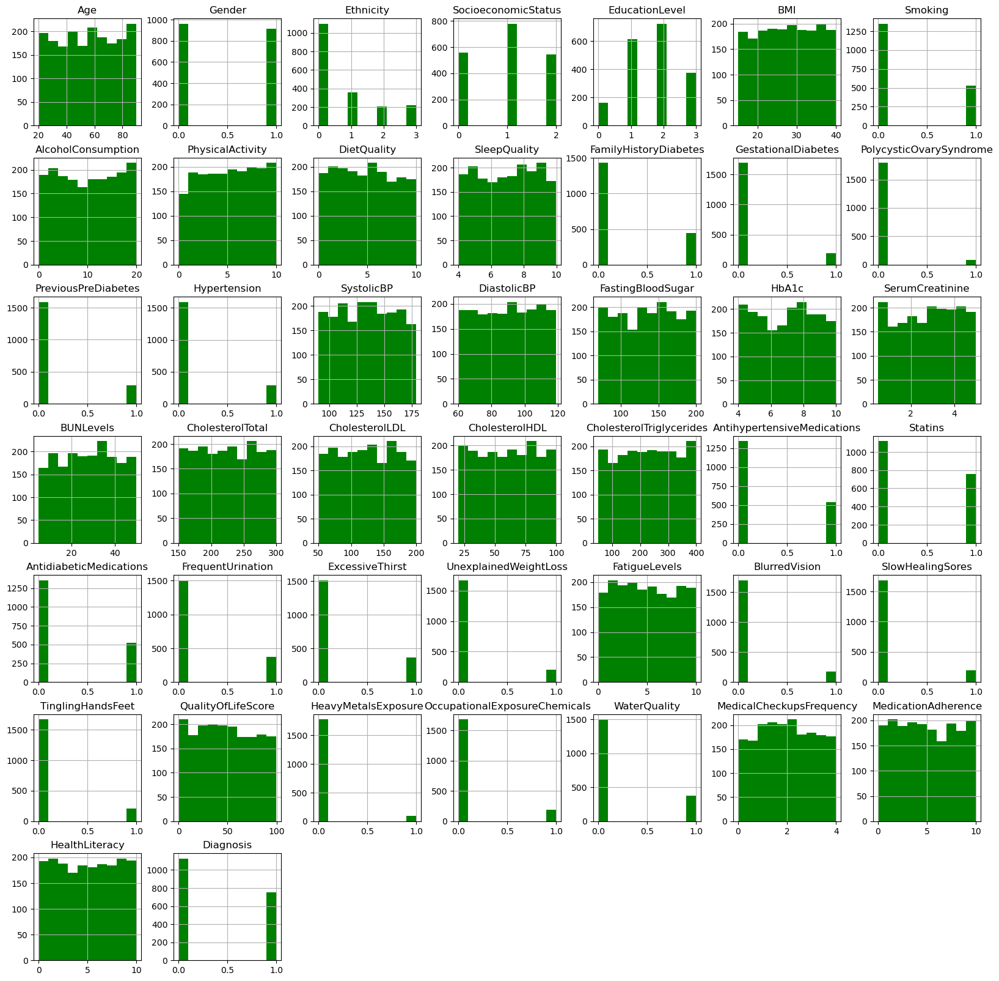

In [755]:
diabetes_df.hist(bins=10, figsize = (20, 20), color = 'g');

2. Another way of visualizing out data is by using the correlation function. We will ignore the white diagonal line because it's just trying to find similarity with itself. But we can look at lighter and brighter colors to find the most similar features.

<Axes: >

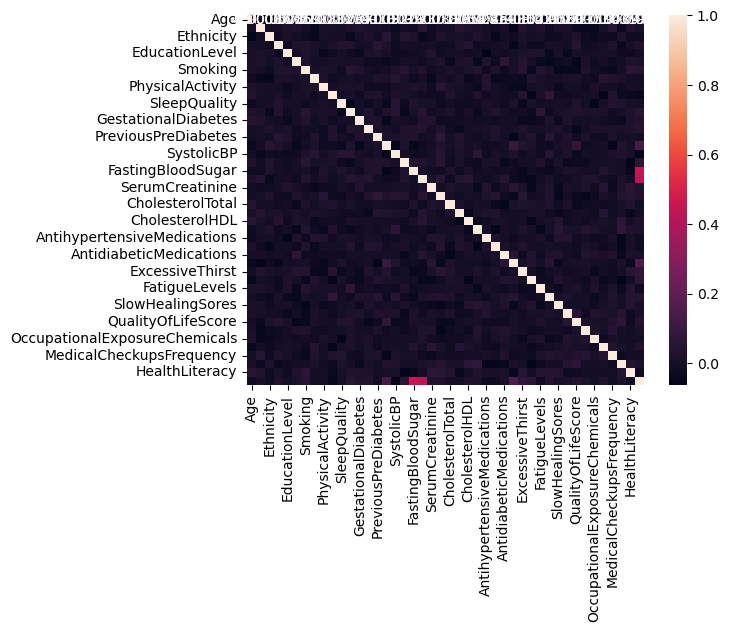

In [756]:
sns.heatmap(diabetes_df.corr(), annot = True)

3. `corr()` is another way of visualizing correlationship with a pair features and the `Diagnosis` results. The blue dot represents the patients who were not diagnosed with diabetes. The orange dot represents patients who are diagnosed with diabetes.

We narrow down the features and join them in strong_features. Here we can notice that `FastingBloodSugar` and `HbA1c` has strong influence on the diabetic results.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

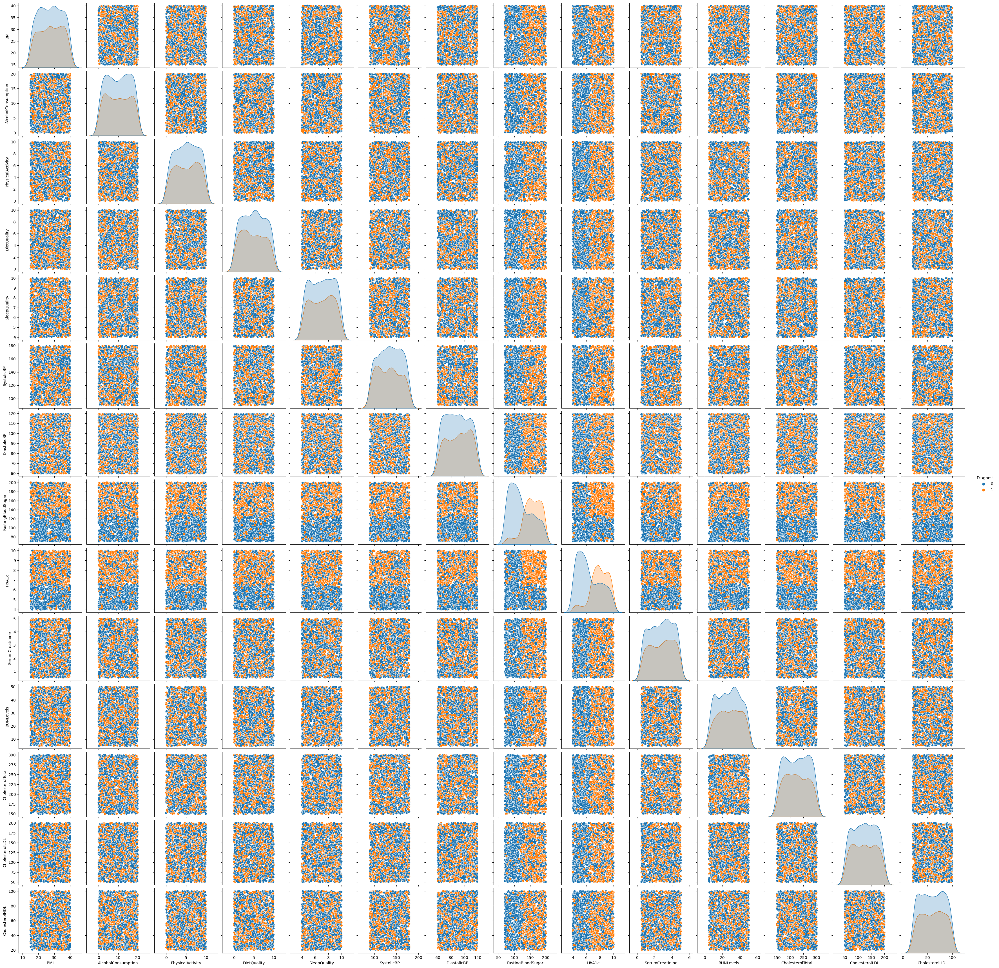

In [757]:
strong_features = ['BMI', 
                   'AlcoholConsumption', 
                   'PhysicalActivity', 
                   'DietQuality', 
                   'SleepQuality',
                   'SystolicBP', 
                   'DiastolicBP',
                   'FastingBloodSugar', 
                   'HbA1c', 
                   'SerumCreatinine', 
                   'BUNLevels', 
                   'CholesterolTotal',
                   'CholesterolLDL', 
                   'CholesterolHDL',
                   'Diagnosis'
                    ]
sns.pairplot(diabetes_df[strong_features], hue="Diagnosis")
plt.show()

# for col1 in selected_features:
#     for col2 in selected_features[1:]:
#         if col1 is not col2:
#             sns.relplot(data=diabetes_df, x=col1, y=col2, hue="Diagnosis")

### IV. Preprocessing

We need to separate the inputs and the output. The X input should contain all of the selected features, except for the `Diagnosis`. The output should contain the `Diagnosis` results, 0 for not diabetic and 1 for diabetic. The output will be the groundtruth for our model later.

In [758]:
X = diabetes_df[strong_features]
X = X.drop(columns='Diagnosis')

In [759]:
Y = diabetes_df['Diagnosis']
Y

0       1
1       1
2       0
3       0
4       0
       ..
1874    0
1875    1
1876    1
1877    1
1878    1
Name: Diagnosis, Length: 1879, dtype: int64

To normalize, we will be using the `MinMaxScaler` from sci-kit learn. `MinMaxScaler()` will take the ratio of how far our data from the midpoint of the minimum and maximum values.


<span style="color:red">## !!!!!! Explain why you chose MinMaxScaler</span>

In [760]:
scaler = MinMaxScaler()
X_norm = scaler.fit_transform(X)
X_norm = pd.DataFrame(X_scaled, columns=X.columns)
X_norm

,BMI,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL
0,0.719155,0.224975,0.244179,0.489903,0.007611,0.033708,0.220339,0.720868,0.881839,0.481826,0.515503,0.695031,0.246498,0.635283
1,0.996715,0.078918,0.830564,0.894218,0.585429,0.842697,0.661017,0.910763,0.555064,0.817111,0.603556,0.035365,0.400412,0.248745
2,0.190460,0.058832,0.610553,0.772336,0.618885,0.325843,0.525424,0.443775,0.013416,0.327725,0.111374,0.543894,0.079935,0.531200
3,0.694792,0.085705,0.865020,0.480422,0.381320,0.887640,0.457627,0.097133,0.419758,0.569107,0.869845,0.176977,0.121330,0.337278
4,0.071385,0.773263,0.463001,0.253243,0.963535,0.842697,0.152542,0.159161,0.267887,0.812254,0.061085,0.048606,0.109570,0.250742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1874,0.231661,0.547393,0.321683,0.833915,0.785141,0.157303,0.237288,0.306154,0.320241,0.775390,0.369952,0.735524,0.331432,0.253700
1875,0.507286,0.803538,0.711050,0.303456,0.078254,0.853933,0.932203,0.159053,0.555987,0.363112,0.053896,0.824802,0.866256,0.360988
1876,0.825491,0.243267,0.988720,0.265670,0.135049,0.426966,0.169492,0.610593,0.150986,0.377175,0.471810,0.956749,0.426170,0.527903
1877,0.696640,0.318175,0.475083,0.873707,0.503431,0.382022,0.525424,0.708084,0.804516,0.087501,0.812743,0.190096,0.610941,0.676745


We want to split our datasets into two:
* The first set will be used for training our model
* The second set will be used for testing to see how good our data in classifying

In [761]:
test_size = 0.25
X_train, X_test, y_train, y_test = train_test_split(X_norm, Y, test_size=test_size, random_state=42)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1409, 14) (470, 14) (1409,) (470,)


For sanity check, let's see if the size of our test set is what we have specified.

In [762]:
print(f"We expect the test size to be {test_size} and we got {(X_test.shape[0]/X_scaled.shape[0]):.2f}")

We expect the test size to be 0.25 and we got 0.25


### V. Training

The neural network architecture for this model has 2 hidden layers with relu activation and the output will be trained based on linear regression. 

We want the input to be the same length as our features. For the output, we want the size to be 1 since we just want a binary output, either 0 or 1.

For binary classification, we want to use 'sigmoid' rather than 'linear'

In [763]:
model = Sequential([
    keras.Input(shape=(14,)),
    Dense(12, activation='relu'),
    Dense(14, activation='relu'),
    Dense(1, activation='sigmoid'),
])

model.summary()

Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_229 (Dense)               │ (None, 12)             │           180 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 14)             │           182 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_231 (Dense)               │ (None, 1)              │            15 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 377 (1.47 KB)

 Trainable params: 377 (1.47 KB)

 Non-trainable params: 0 (0.00 B)

For the loss function, we want to use binary entropy rather than 'mean square error'). We also want to monitor the accuracy of our model for each epoch.

In [764]:
model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

In [765]:
epochs_hist = model.fit(X_train, y_train, epochs = 100, batch_size = 50, validation_split = 0.2)

Epoch 1/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5929 - loss: 0.7223 - val_accuracy: 0.6277 - val_loss: 0.6626
Epoch 2/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 796us/step - accuracy: 0.5527 - loss: 0.6910 - val_accuracy: 0.6596 - val_loss: 0.6573
Epoch 3/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 786us/step - accuracy: 0.5824 - loss: 0.6738 - val_accuracy: 0.6631 - val_loss: 0.6406
Epoch 4/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 791us/step - accuracy: 0.6084 - loss: 0.6539 - val_accuracy: 0.6915 - val_loss: 0.6241
Epoch 5/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 643us/step - accuracy: 0.6638 - loss: 0.6326 - val_accuracy: 0.6986 - val_loss: 0.6066
Epoch 6/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 570us/step - accuracy: 0.7043 - loss: 0.6161 - val_accuracy: 0.7270 - val_loss: 0.5892
Epoch 7/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 631us/step - accuracy: 0.7442 - loss: 0.5909 - val_accuracy: 0.7376 - val_loss: 0.5666
Epoch 8/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 589us/step - accuracy: 0.7749 - loss: 0.5696 - val_accura

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 562us/step - accuracy: 0.8177 - loss: 0.4119 - val_accuracy: 0.8617 - val_loss: 0.3953
Epoch 52/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 582us/step - accuracy: 0.8439 - loss: 0.3792 - val_accuracy: 0.8511 - val_loss: 0.3984
Epoch 53/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step - accuracy: 0.8544 - loss: 0.3602 - val_accuracy: 0.8475 - val_loss: 0.3975
Epoch 54/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 560us/step - accuracy: 0.8460 - loss: 0.3836 - val_accuracy: 0.8475 - val_loss: 0.3963
Epoch 55/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 540us/step - accuracy: 0.8276 - loss: 0.3975 - val_accuracy: 0.8582 - val_loss: 0.3894
Epoch 56/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 532us/step - accuracy: 0.8501 - loss: 0.3893 - val_accuracy: 0.8475 - val_loss: 0.3986
Epoch 57/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 539us/step - accuracy: 0.8299 - loss: 0.4139 - val_accuracy: 0.8582 - val_loss: 0.3926
Epoch 58/100
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 537us/step - accuracy: 0.8433 - loss: 0.3926 - val_accuracy:

We can plot the model's accuracy on each epoch.

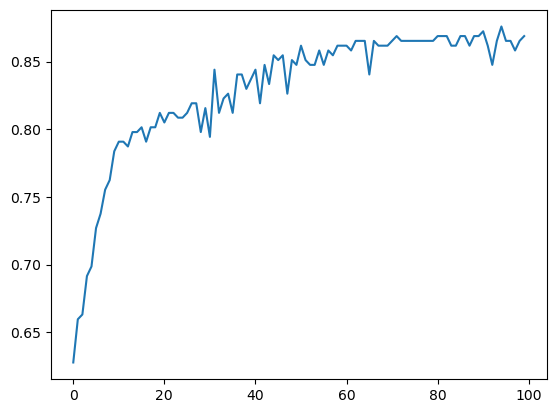

In [766]:
epochs_hist.history.keys()
plt.plot(epochs_hist.history['val_accuracy'])

### VI. Evaluation
We want to use `evaluate()`.

In [767]:
loss, accuracy = model.evaluate(X_test, y_test)

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 271us/step - accuracy: 0.8426 - loss: 0.3934


In [768]:
print(f"The accuracy of our model is {(accuracy * 100):.2f}%")

The accuracy of our model is 83.62%


### VII. Prediction

We want to choose the right decision boundary

<span style="color:red">HOW</span>

In [769]:
# Convert actual output to numpy array
y_actual = np.array(y_test)

# Do prediction on test set
y_pred = model.predict(X_test)
y_pred = y_pred.squeeze()

# Search for an optimal value for the decision line
steps = range(10, 90, 1)
results = []
decision_val = val = 0

for step in steps:
    x_val = step/100
    y_vals = np.array([1 if x >= x_val else 0 for x in y_pred]) 
    ct = sum([int(pred == act) for pred, act in zip(y_vals, y_actual)])
    
    results.append(ct)
    
    if ct > decision_val:
        decision_val = ct
        val = x_val
decision_val = decision_val/1000
print(val)
y_pred = [1 if x >= val else 0 for x in y_pred]


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
0.55


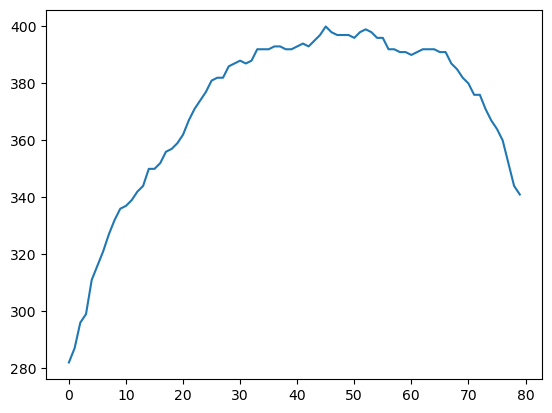

In [770]:
plt.plot(results)

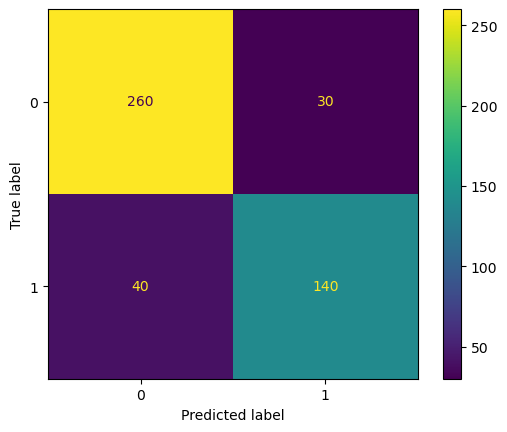

In [771]:
mat = confusion_matrix(y_actual, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = mat)
disp.plot()

In [772]:
print(f"Accuracy from the prediction: {(mat.trace()/ mat.sum())*100:.2f}%")

Accuracy from the prediction: 85.11%


### Modifications
* During the training, we reduce to hidden layer to 2 with fewer units.
* During the prediction, we used the optimal decision value by adjusting the step increments by 0.01. We found that the the sweet spot is at 0.48 instead of 0.05

### Things to improve
* Use polynomial to see if features needed to be changed.
* Apply existing models and evaluate their performance.